In [1]:
# Import libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Load dataset

In [5]:
df = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.shape

(8425, 23)

In [7]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [9]:
# There are two types of data i.e. Flaot and object Datatype

In [10]:
# Missing Values

In [11]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [12]:
# There are many null columns in the dataset

In [13]:
# The columns like Date and Location doen't contain null values

In [14]:
# Searching for rows with no information in the dataset

In [15]:
# Checking the null values

In [16]:
missing_value = df.isnull().sum().to_frame("Null Values")
#Calculating the Percentage of missing values
missing_value['% of Missing  Values'] = round((missing_value["Null Values"]/len(df))*100,2)
missing_value

,Null Values,% of Missing Values
Date,0,0.00
Location,0,0.00
MinTemp,75,0.89
MaxTemp,60,0.71
Rainfall,240,2.85
Evaporation,3512,41.69
Sunshine,3994,47.41
WindGustDir,991,11.76
WindGustSpeed,991,11.76
WindDir9am,829,9.84


In [17]:
# Storing only the column with null values
missing_value = missing_value[missing_value['Null Values'] > 0].sort_values(by='% of Missing  Values', ascending=False)
missing_value

,Null Values,% of Missing Values
Sunshine,3994,47.41
Evaporation,3512,41.69
Cloud3pm,2455,29.14
Cloud9am,2421,28.74
Pressure3pm,1312,15.57
Pressure9am,1309,15.54
WindGustDir,991,11.76
WindGustSpeed,991,11.76
WindDir9am,829,9.84
WindDir3pm,308,3.66


In [18]:
# Searching for rows with no information in the dataset

In [19]:
# Create a mask for rows where all specified columns have missing values
missing_values_col = missing_value.index.tolist()
mask = df[missing_values_col].isnull().all(axis=1)

# Use the mask to filter the dataframe and get rows with all missing values
rows_with_all_missing = df[mask]

# Display the rows with all missing values
print(f"Columns with all missing values:\n{missing_values_col}\n\n Number of Rows in almost all columns:\n{rows_with_all_missing.shape[0]}") 
print(f"This represents {round(rows_with_all_missing.shape[0]/df.shape[0]*100,2)}% of the dataset.\n")
print("Rows with null values")
rows_with_all_missing      

Columns with all missing values:
['Sunshine', 'Evaporation', 'Cloud3pm', 'Cloud9am', 'Pressure3pm', 'Pressure9am', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'Rainfall', 'RainToday', 'RainTomorrow', 'WindSpeed3pm', 'Humidity3pm', 'Temp3pm', 'WindSpeed9am', 'MinTemp', 'MaxTemp', 'Humidity9am', 'Temp9am']

 Number of Rows in almost all columns:
9
This represents 0.11% of the dataset.

Rows with null values


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
1813,2014-03-31,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1814,2014-04-01,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1815,2014-04-02,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1816,2014-04-03,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1817,2014-04-04,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2164,2015-03-17,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2165,2015-03-18,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2166,2015-03-19,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2199,2015-04-21,Newcastle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# Dropping all the 9 rows with null values
df = df[~mask]
print(f"The new dimension of the dataset is {df.shape}")

The new dimension of the dataset is (8416, 23)


In [21]:
# Unique Values

In [22]:
# Reviewing the number of unique values in each feature and target
info_df = df.nunique().to_frame("No. of Unique Values")
info_df['type'] = df.dtypes.values
info_df

,No. of Unique Values,type
Date,3004,object
Location,12,object
MinTemp,285,float64
MaxTemp,331,float64
Rainfall,250,float64
Evaporation,116,float64
Sunshine,140,float64
WindGustDir,16,object
WindGustSpeed,52,float64
WindDir9am,16,object


In [23]:
# About the number of unique values

In [24]:
# Rainfall is the target variable with 250 unique values of 8452 values in a dataset
# We are facing a regression problem here as data is continous and numerical

In [25]:
# Rain Tomorrow is the othertarget variable with 2 unique values of No and Yes
# We are facing a classification problem here as data is categorical

In [26]:
# Date datatype is object so we need to convert it to datetime

In [27]:
# We can conclude that the variables like  WindGustDir(16), WindDir9am(16), WindDir3pm(16), RainToday(2), RainTomorrow(2),Location(12)which are object datatype  are categorical

In [28]:
# However other columns like  Cloud9am, Cloud3pm , despite being numerical, seem to be categorical and should be analyzed as categoricalas well

In [29]:
# Rainfall Unique values 

In [30]:
# Converting date column from object to datetime
df['Date'] = pd.to_datetime(df['Date'])

In [31]:
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['number']).columns

In [32]:
print(f"Numerical Columns:\n{numerical_columns}\n\nCategorical Columns:\n{categorical_columns}")

Numerical Columns:
Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

Categorical Columns:
Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')


In [33]:
unique_value_count = {}
for col in categorical_columns:
    unique_value_count[col] = df[col].value_counts() 
for col, count in unique_value_count.items():    
    print(f" Unique values in column {col}:\n {count} \n")

 Unique values in column Location:
 Location
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        813
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: count, dtype: int64 

 Unique values in column WindGustDir:
 WindGustDir
N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: count, dtype: int64 

 Unique values in column WindDir9am:
 WindDir9am
N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: count, dtype: int64 

 Unique values in column WindDir3pm:
 WindDir3pm
SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    4

In [34]:
unique_value_count = {}
for col in numerical_columns:
    unique_value_count[col] = df[col].value_counts() 
for col, count in unique_value_count.items():    
    print(f" Unique values in column {col}:\n {count} \n")

 Unique values in column MinTemp:
 MinTemp
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: count, Length: 285, dtype: int64 

 Unique values in column MaxTemp:
 MaxTemp
19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
11.2     1
43.1     1
42.7     1
42.9     1
43.5     1
Name: count, Length: 331, dtype: int64 

 Unique values in column Rainfall:
 Rainfall
0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: count, Length: 250, dtype: int64 

 Unique values in column Evaporation:
 Evaporation
4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
17.0      1
18.6      1
22.4      1
19.2      1
0.7       1
Name: count, Length: 116, dtype: int64 

 Unique values in column Sunshine:
 Sunshine
0.0     166
11.1     68
11.2     67
11.0     66
10.7     64
       ...

In [35]:
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8416,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,2012-08-04 14:42:22.585551360,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
min,2008-12-01 00:00:00,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,2010-07-13 00:00:00,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,2011-12-23 00:00:00,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,2014-09-11 00:00:00,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,2017-06-25 00:00:00,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000
std,NaN,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020


In [36]:
df.describe(exclude = [np.number])  

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,8416,8416,7434,7596,8117,8185,8186
unique,NaN,12,16,16,16,2,2
top,NaN,Melbourne,N,N,SE,No,No
freq,NaN,1622,713,906,813,6195,6195
mean,2012-08-04 14:42:22.585551360,NaN,NaN,NaN,NaN,NaN,NaN
min,2008-12-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
25%,2010-07-13 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
50%,2011-12-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
75%,2014-09-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
max,2017-06-25 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
# Summary of the datasets looks perfect as we can see that there no negative/invalid values in the dataset

In [38]:
# However the count of several columns have differences from the total rows which means that there are missing values in the datasets

In [39]:
# Duplicates

In [40]:
df.duplicated().sum()

1663

In [41]:
# This means that there are 1663 duplicate rows in the dataset

In [42]:
df = df.drop_duplicates()
df.shape

(6753, 23)

In [43]:
# We have dropped 1663 duplicate rows in the dataset

In [44]:
# Univariate Analysis

In [45]:
# Creating Visualization for Numerical columns 

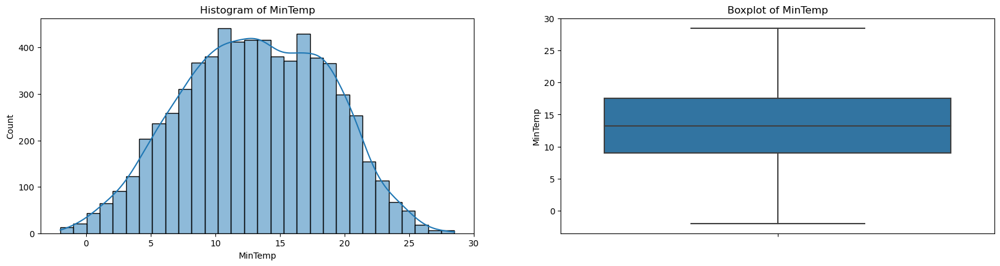

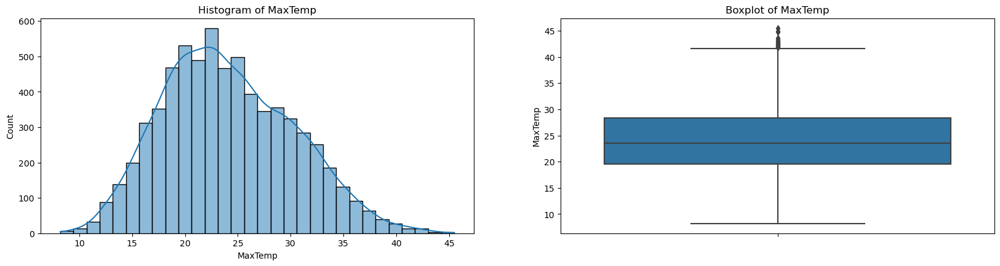

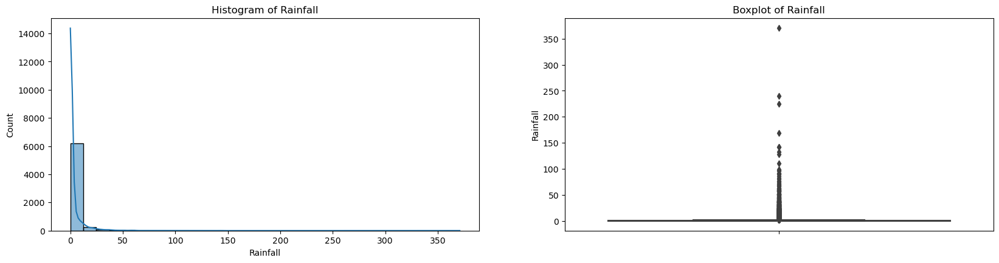

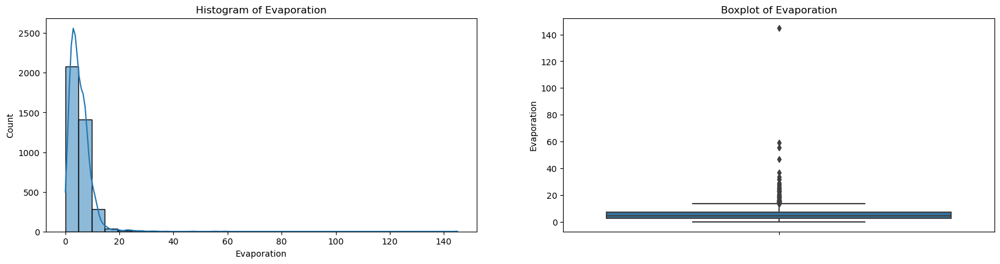

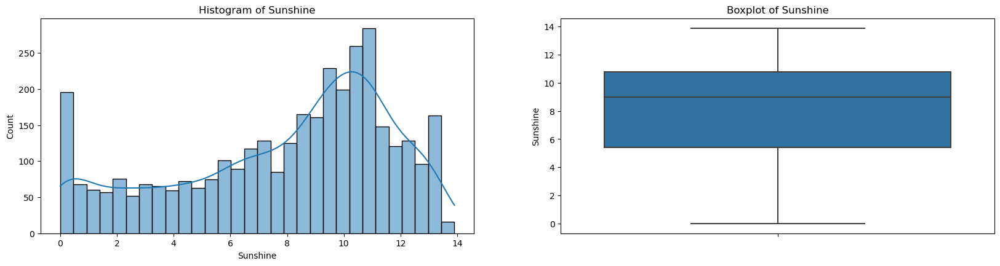

...

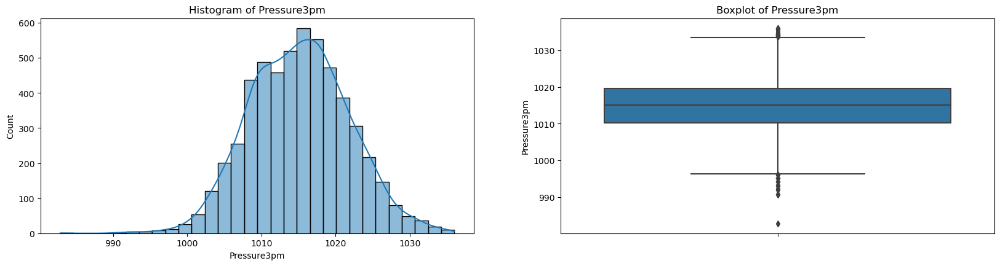

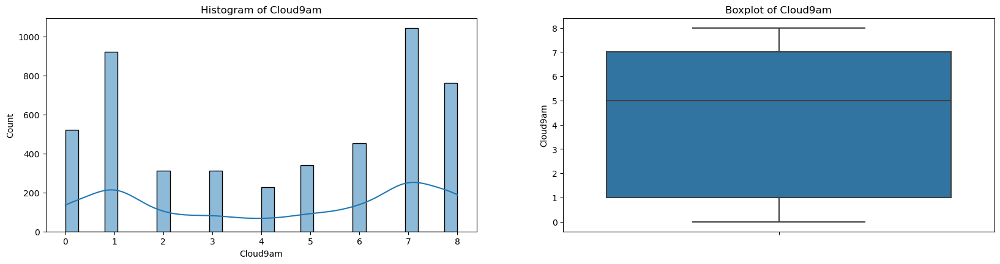

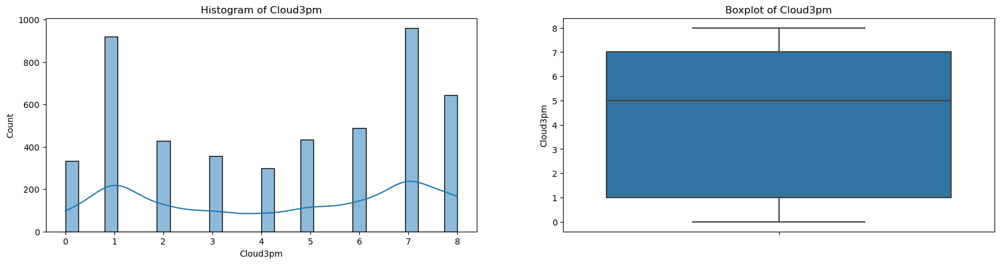

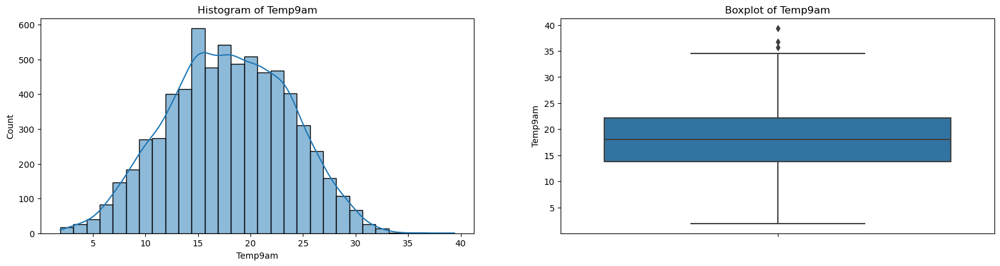

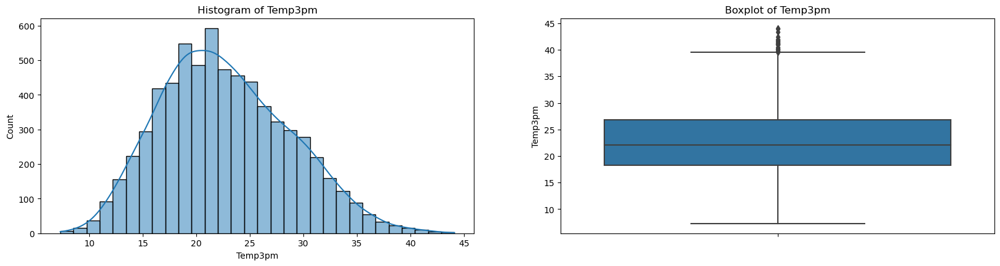

In [46]:
for col in numerical_columns:
    plt.figure(figsize=(20,10))
    # Histogram
    plt.subplot(2,2,1)
    sns.histplot(df[col], kde = True, bins = 30)
    plt.title(f'Histogram of {col}')
    #Boxplot
    plt.subplot(2,2,2)
    sns.boxplot(y = df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [47]:
# Rainfall Distribution

In [48]:
# The distribution of rainfall is skewed to the right and presents a high percentage of zeroes.There are outliers present in the boxplot

In [49]:
#'MinTemp' Feature

In [50]:
# The 'MinTemp'Distribution is skewed to the left. There are no outliers present in our dataset. 

In [51]:
# 'MaxTemp' Feature

In [52]:
# The distribution of 'MaxTemp' is skewed to the right. There are outliers present in our dataset

In [53]:
# Evaporation Feature

In [54]:
# The distribution of evaporation is skewed to the right.There are outliers present in our dataset

In [55]:
# Creating Visualization for Categorical Columns 

In [56]:
# Sunshine Feature 

In [57]:
# The Distribution of 'Sunshine' is skewed to the left. There are  no outliers present in our dataset

In [58]:
# WindGustSpeed distribution

In [59]:
# The distribution of 'WindGustSpeed' is skewed to the right. There are outliers present in our dataset

In [60]:
# WindSpeed9am distribution

In [61]:
# The distribution of 'WindSpeed9am' is skewed to the right. There are outliers present in boxplot

In [62]:
# WindSpeed3pm distribution

In [63]:
# The distribution of 'WindSpeed3pm' is skewed to the right. There are outliers present in boxplot

In [64]:
# Humidity 9am distribution

In [65]:
# The distribution of 'Humidity9am' is skewed to the left. There are outliers present in boxplot

In [66]:
# Humidity 3pm distribution

In [67]:
# The distribution of 'Humidity3pm' seems almost normal. There are outliers present in boxplot

In [68]:
# Pressure 9am distribution

In [69]:
# The distribution of 'Pressure9am' seems to be normal despite there being outliers in boxplot

In [70]:
# Pressure 3pm distribution

In [71]:
# The distribution of 'Pressure3pm' seems to be normal despite there being outliers in boxplot

In [72]:
# Cloud 9am distribution

In [73]:
# The distribution of 'Cloud9am' has two high points 1 and 7. There are  no outliers present in boxplot

In [74]:
df['Cloud9am'].value_counts()

Cloud9am
7.0    1043
1.0     922
8.0     764
0.0     521
6.0     454
5.0     341
3.0     313
2.0     311
4.0     227
Name: count, dtype: int64

In [75]:
# As we can see that this feature can give us more information if we analyze it as a categorical feature

In [76]:
# Cloud3pm distribution

In [77]:
# The distribution of 'Cloud3pm' has two high points 1 and 7. There are  no outliers present in boxplot

In [78]:
 df['Cloud3pm'].value_counts()

Cloud3pm
7.0    959
1.0    921
8.0    644
6.0    489
5.0    433
2.0    428
3.0    357
0.0    332
4.0    297
Name: count, dtype: int64

In [79]:
# As we can see that this feature can give us more information if we analyze it as a categorical feature

In [80]:
#Temp9am distribution

In [81]:
# The distribution of 'Temp9am' is skewed to the left. There are some outliers present in boxplot

In [82]:
# Temp3pm distribution

In [83]:
# The distribution of 'Temp3pm' is skewed to the right. There are outliers present in boxplot

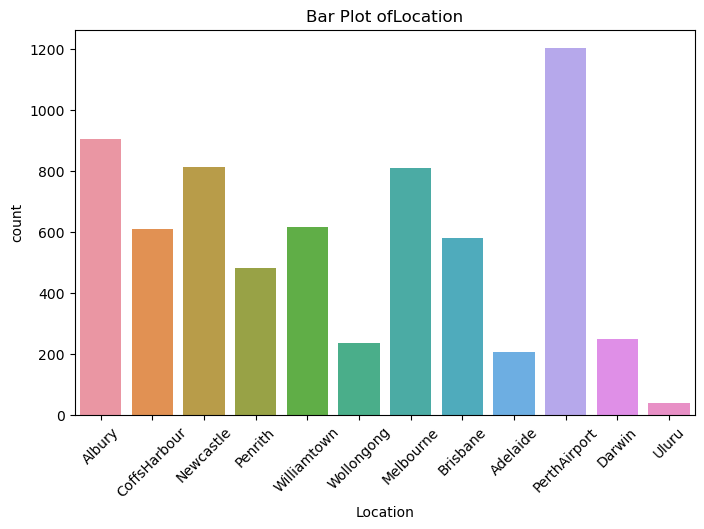

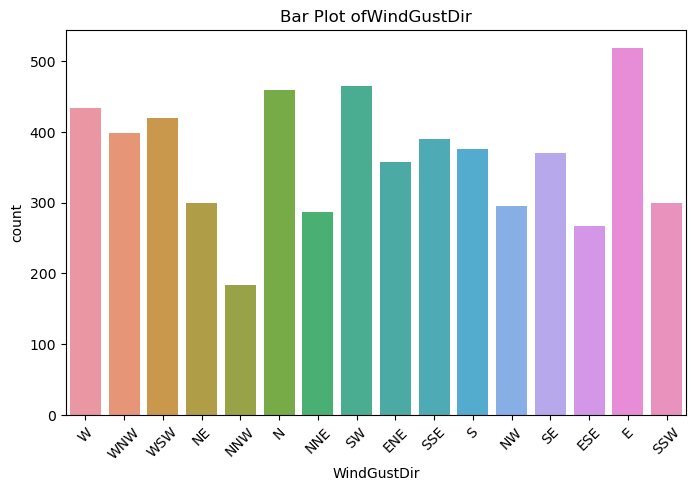

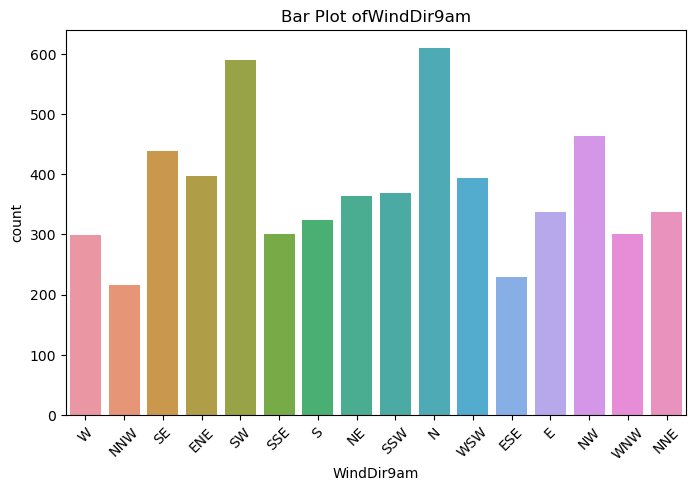

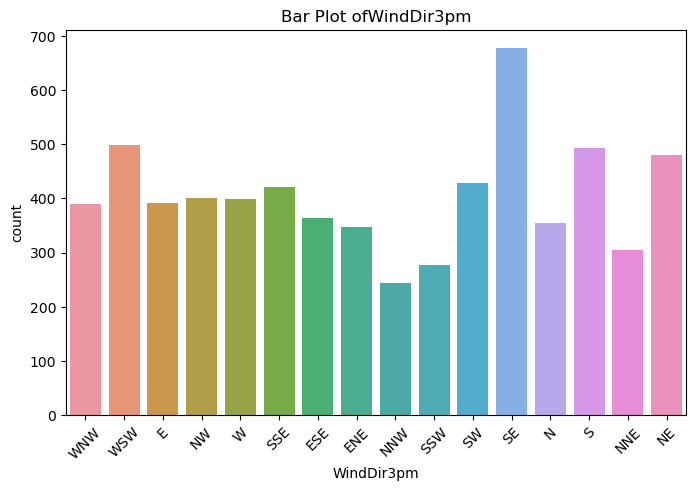

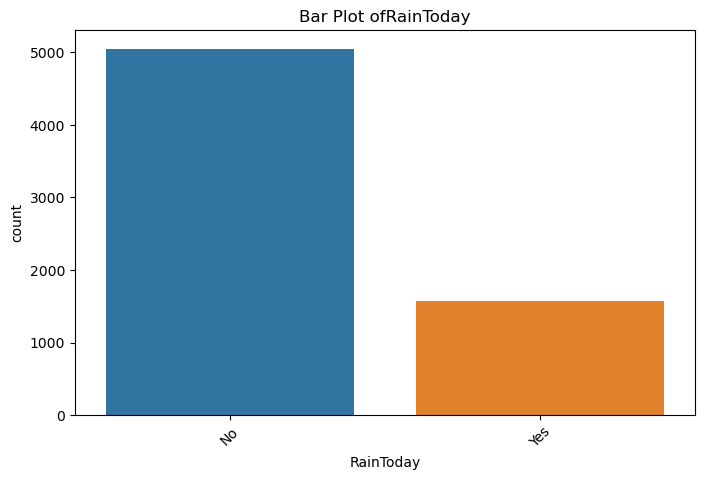

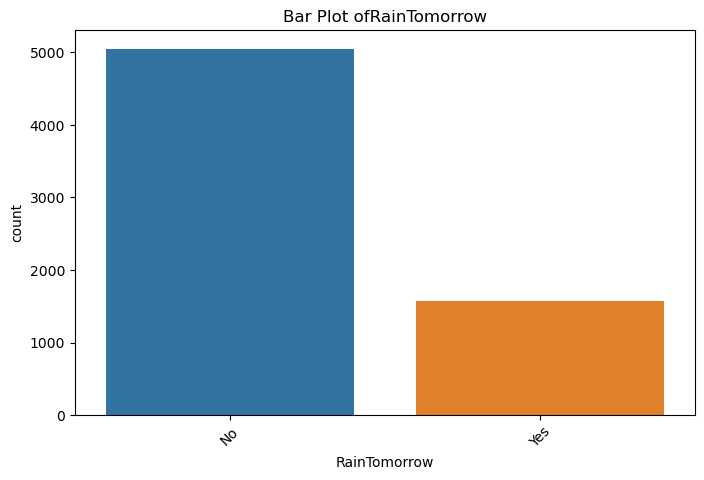

In [84]:
for col in categorical_columns:
    plt.figure(figsize = (8,5))
    # Barplot
    sns.countplot(x=df[col])
    plt.title(f'Bar Plot of{col}')
    plt.xticks(rotation = 45)
    
    plt.show()

In [85]:
# Rainfall Tomorrow Feature

In [86]:
 df['RainTomorrow'].value_counts()

RainTomorrow
No     5052
Yes    1572
Name: count, dtype: int64

In [87]:
# The target variable is imbalaced

In [88]:
# LOCATION FEATURE 

In [89]:
# The observation corresponds to 12 columns . Most of them were taken PerthAirport, then Albury, Newcastle, Melbourne and so on
# for Uluru there are few observations

In [90]:
# WindGustDir Feature

In [91]:
# The 5 wind gusts most common directions are East,Southwest,North, West and West-Southern in the observations.The least frequent
# is North-Northwest

In [92]:
# Wind Dir9am Feature

In [93]:
# The five most common wind directions are at 9am are North, Southwest, Northwest, Southeast and East-Northwest
# The least frequent are North- Northwest

In [94]:
# WindDir3pm

In [95]:
# The five most common directions at 3 pm are Southeast, West-southwest, south, northeast and southwest

In [96]:
# RainToday Feature

In [97]:
df['RainToday'].value_counts()

RainToday
No     5052
Yes    1572
Name: count, dtype: int64

In [98]:
# The data is imbalanced

In [99]:
# BIVARIATE ANALYSIS

In [100]:
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day

In [101]:
df.drop('Date', axis = 1, inplace = True)

In [102]:
# Scatter Plots for numerical columns 

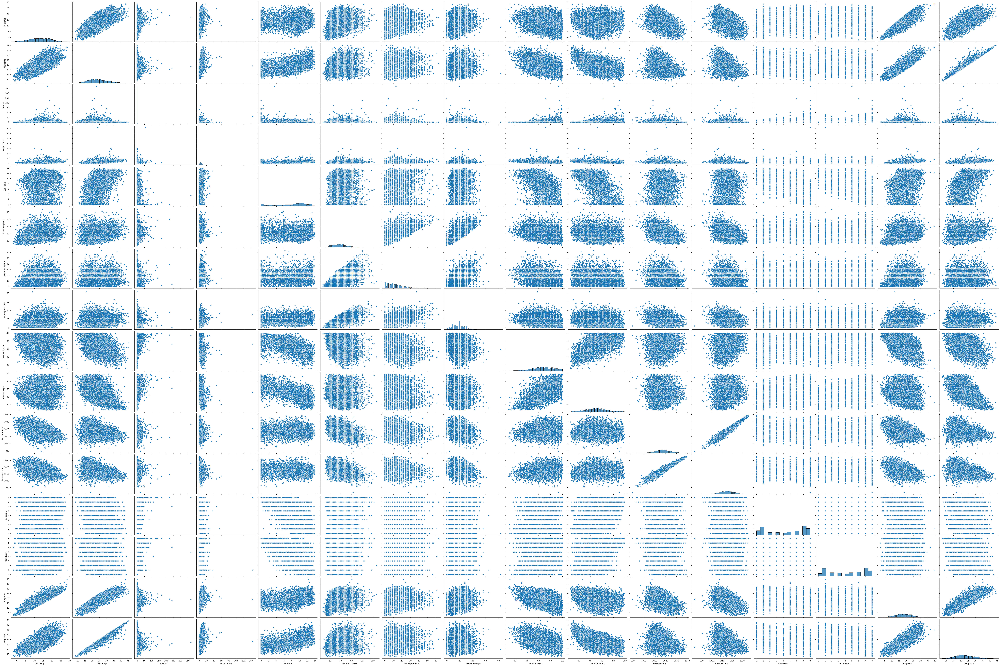

In [103]:
sns.pairplot(df[numerical_columns], height=3, aspect=1.5)
plt.show()

In [104]:
# Boxplot for numerical and categorical columns

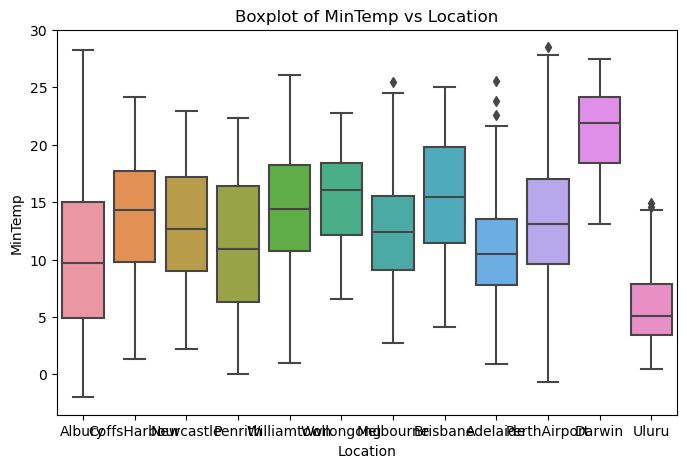

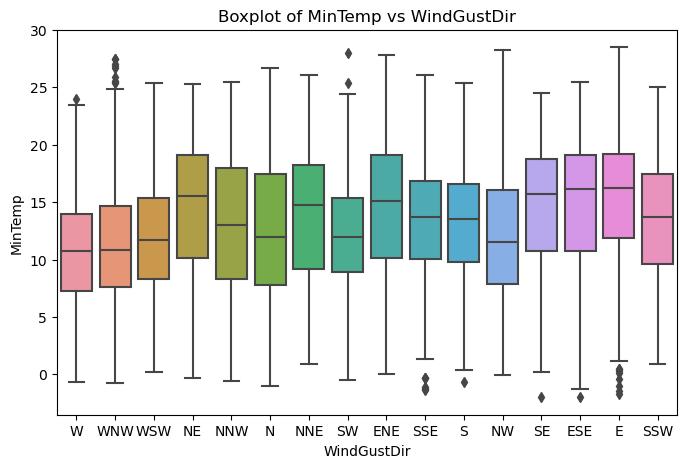

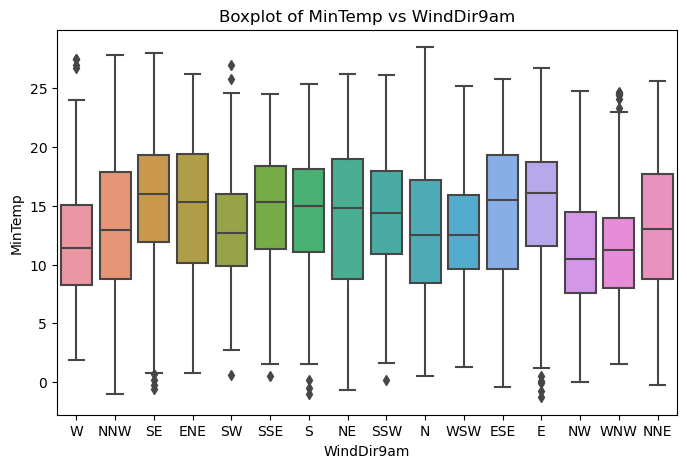

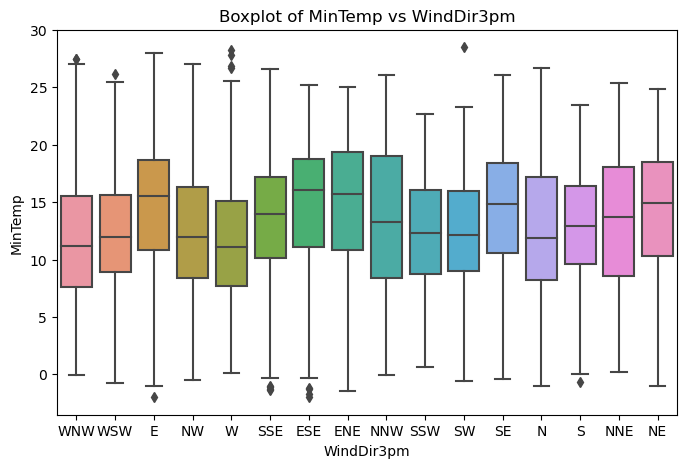

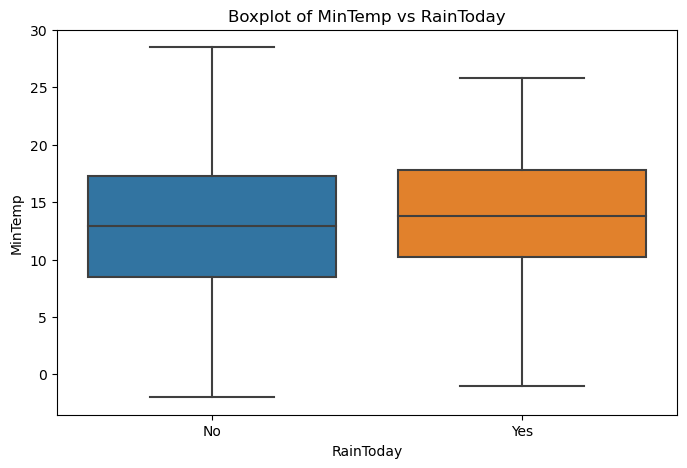

...

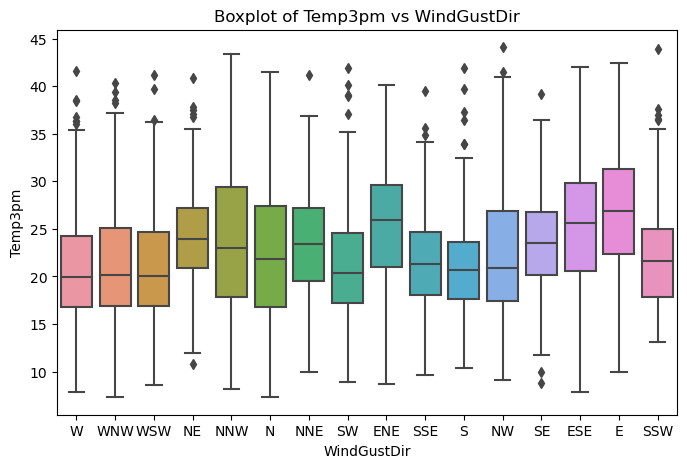

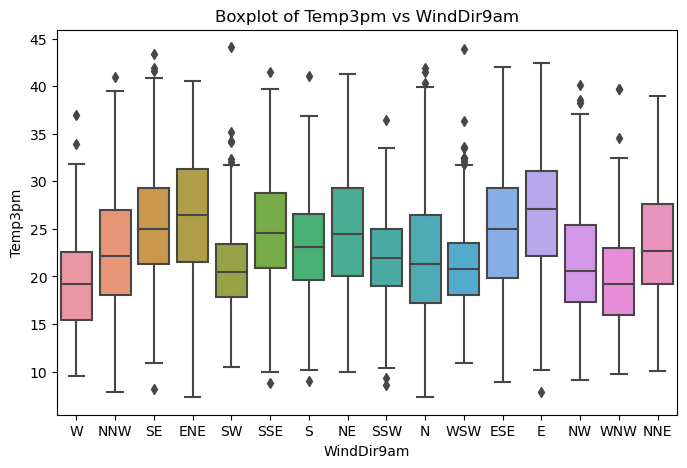

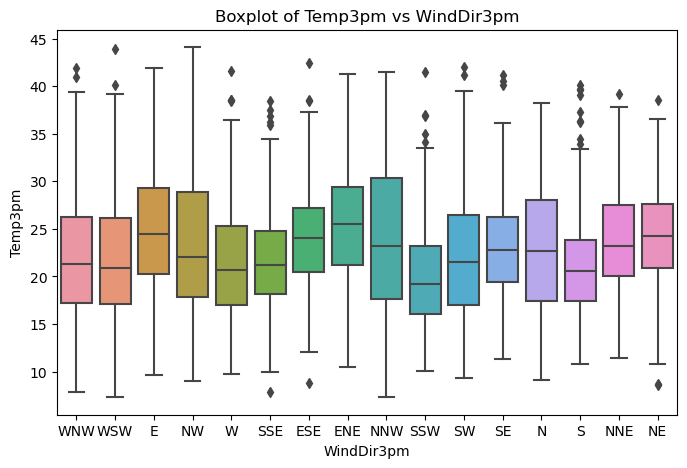

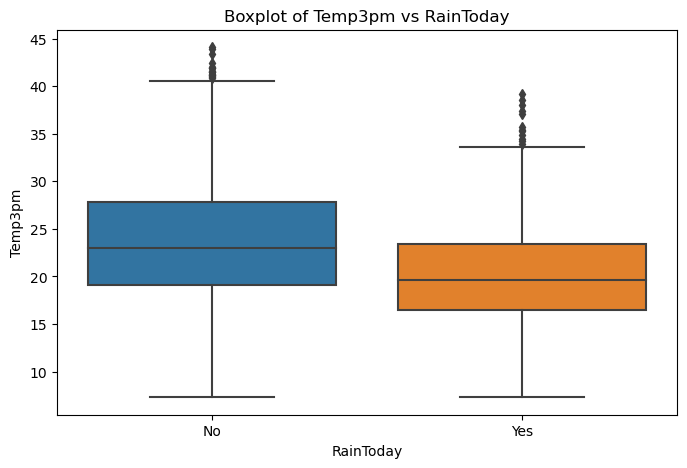

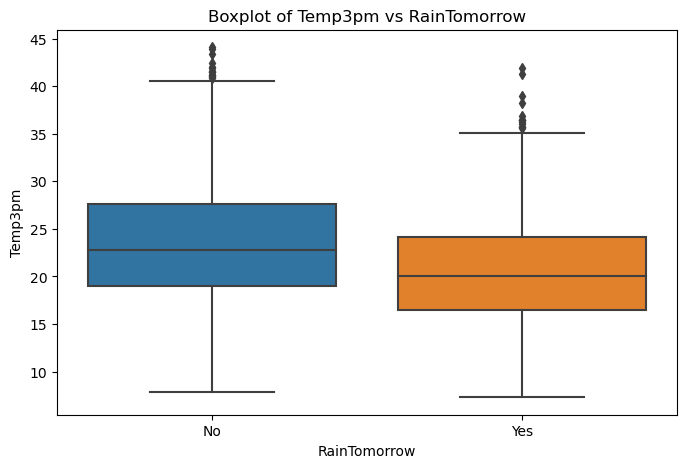

In [115]:
for num_col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize = (8,5))
        # Boxplot
        sns.boxplot(x = df[cat_col], y = df[num_col])
        plt.title(f'Boxplot of {num_col} vs {cat_col}')
        plt.show()

In [110]:
# Maximum Temperature registered was about 45.5 Celsius in first quarter of 2017 and lowest temperature was recorded in second quarter of 2009

In [111]:
# Williamton's has observations between 2015 and 2017 and it is the only place that registers measurements above 20

In [112]:
# Windgustspeed varies from 20 km/hr to 60 km/hr on average , but for locations like Albury and Melbourne, there are observations that exceeds 100 km/hr

In [113]:
# The wind speed averaged over 10 minutes prior to 9am seems to have an impact on the rain tomorrow 

In [114]:
# The Humidity(%) at 9am seems to have an impact on the rain tomorrow in all almost all locations.Except for Uluru where there are no observations for yes 
# in the Rain Tomorrow variable

In [116]:
# According to observations the higher measurements of atmospheric pressure took place at 9 a.m. .

In [117]:
# The Atmospheric pressure at 9 am has different tendencies when impacting  on the Rain Tomorrow variable varying between locations. 

In [118]:
# In Uluru ,there are no observations for yes Rain Tomorrow variable

In [119]:
# According to observations , both in the morning and in the afternoon there are similiar slightly ranges for the 9am measurement
# of sky obscured by cloud

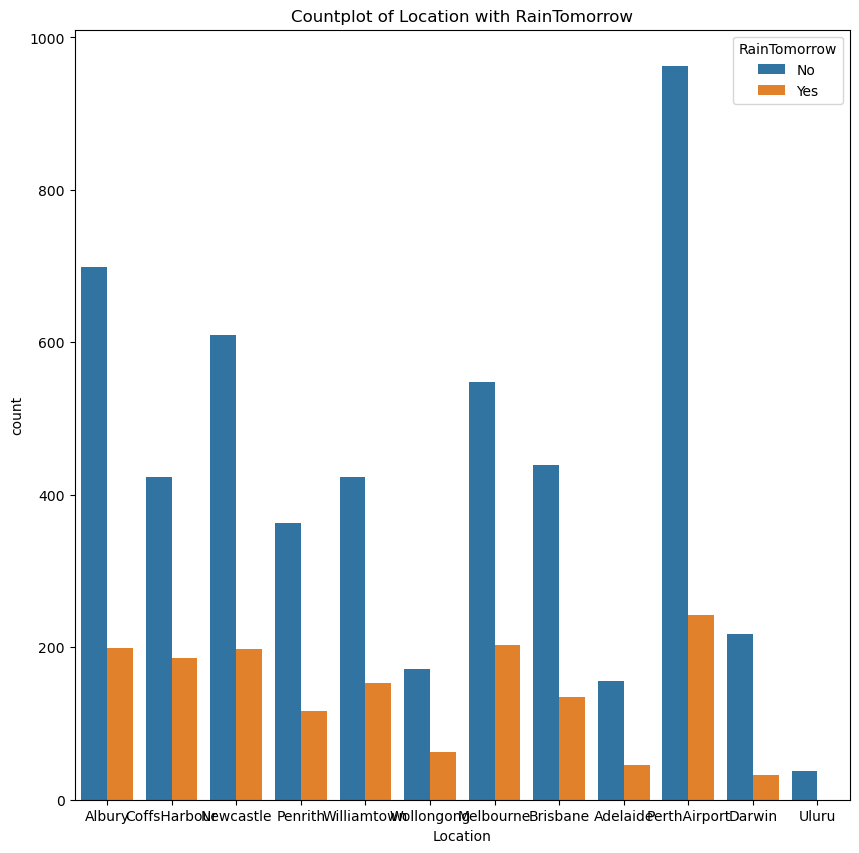

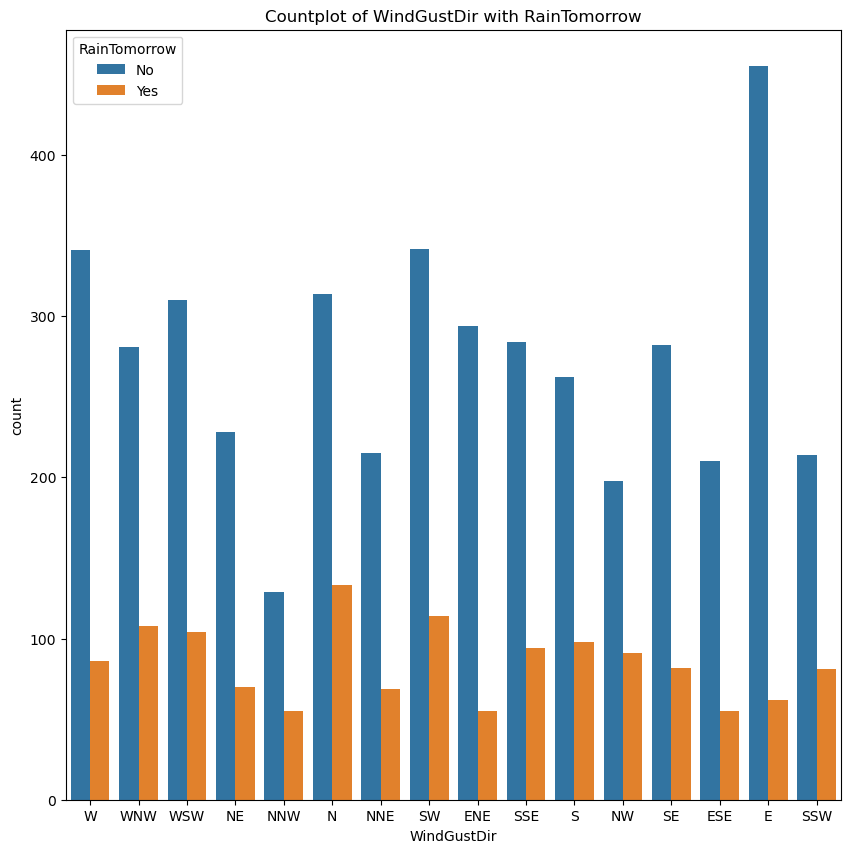

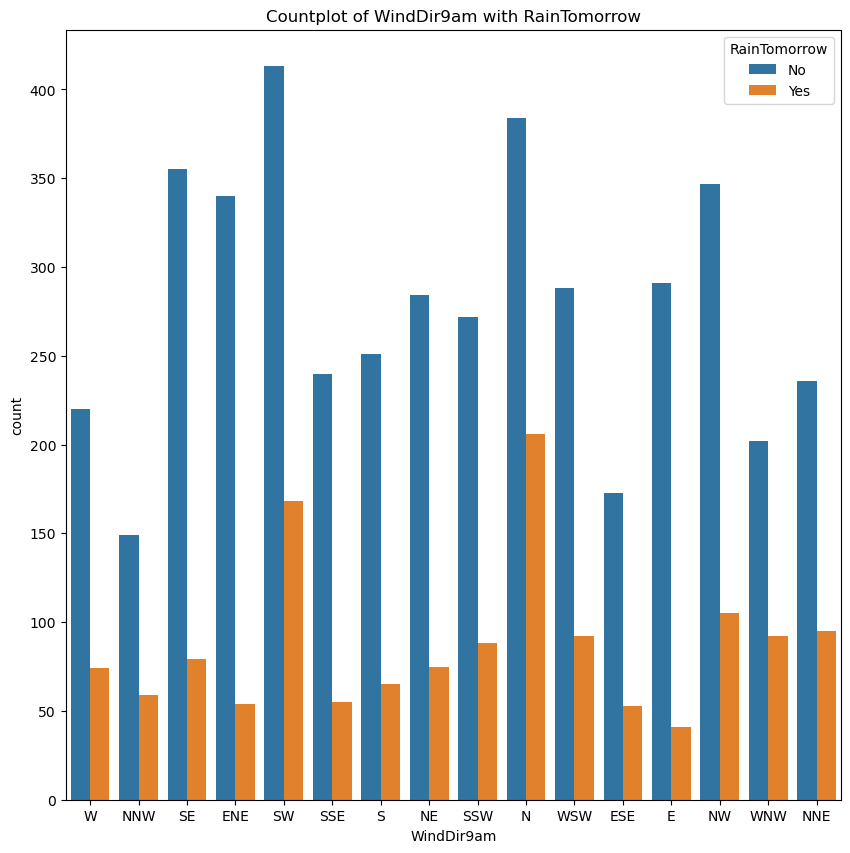

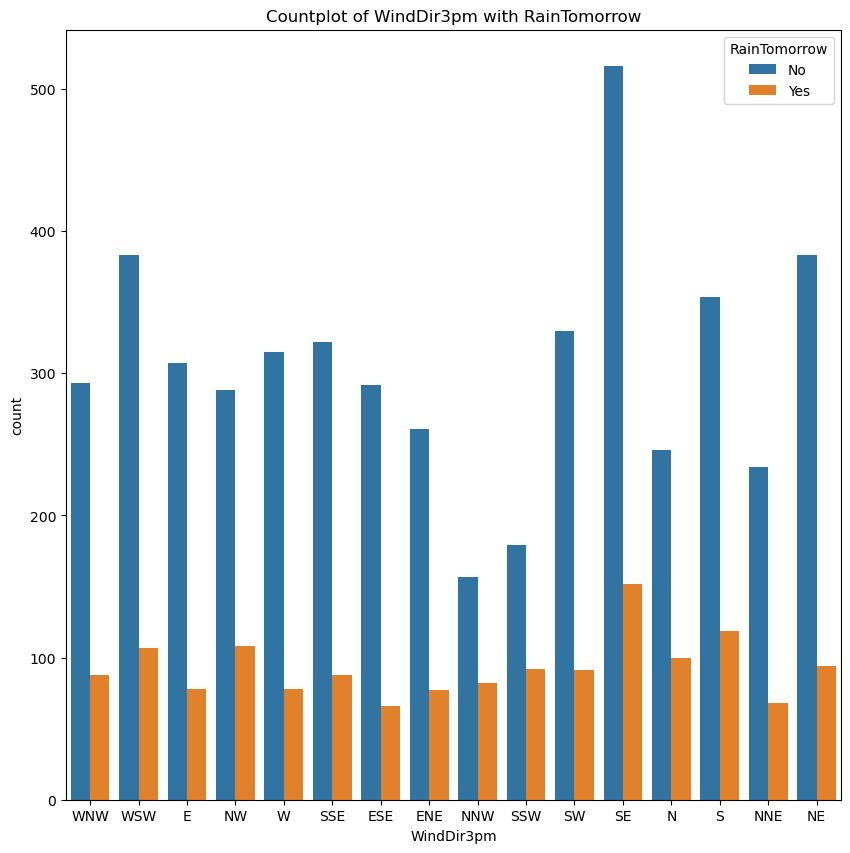

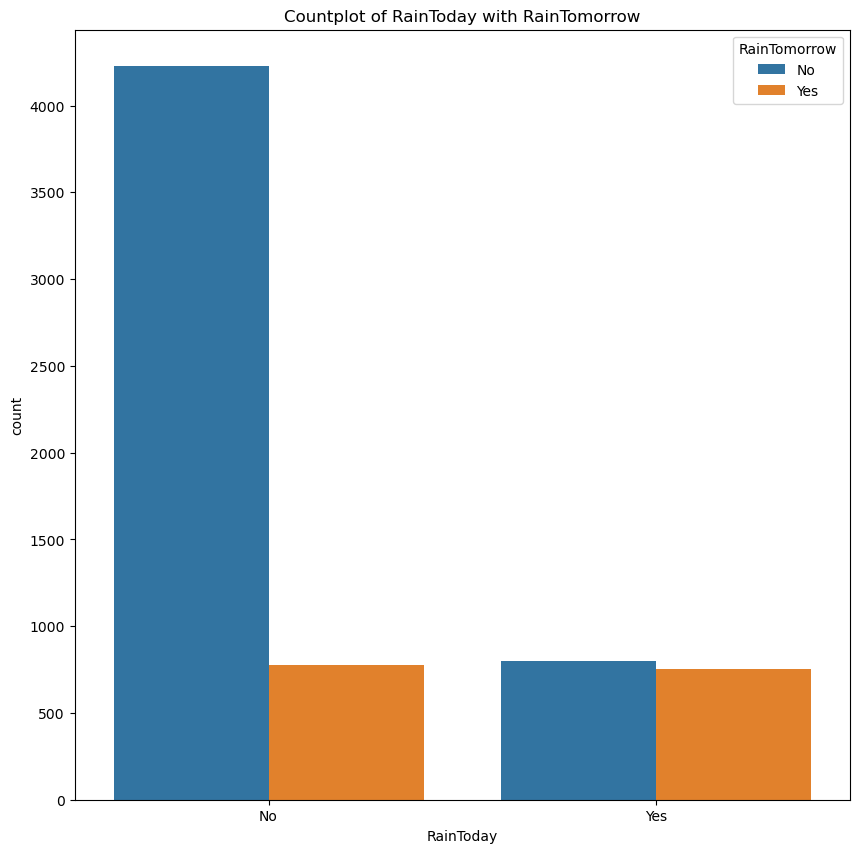

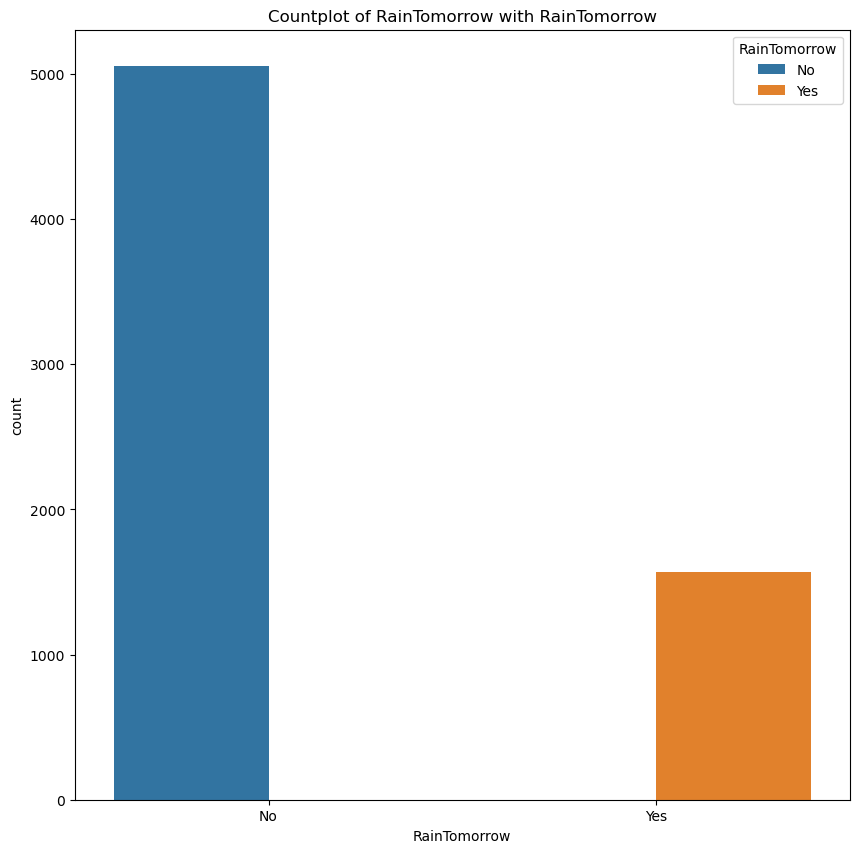

In [120]:
#countplot for categorical columns
for cat_col in categorical_columns:
    plt.figure(figsize = (10,10))
    # Countplot
    sns.countplot(x = df[cat_col], hue = df['RainTomorrow'])
    plt.title(f'Countplot of {cat_col} with RainTomorrow')
    plt.show()

In [121]:
# The fraction of sky obscured by cloud at 9am tends to be higher when the RainTomorrow variable target variable is yes 

In [122]:
# In uluru there are no observations for yes in the Rain Tomorrow variable 

In [123]:
# The Temperature at 9am tends to be slightly higher when the Rain Tomorrow variable target variable is yes

In [124]:
# In Uluru there are no observations for yes in the rainfall tomorrow variable 

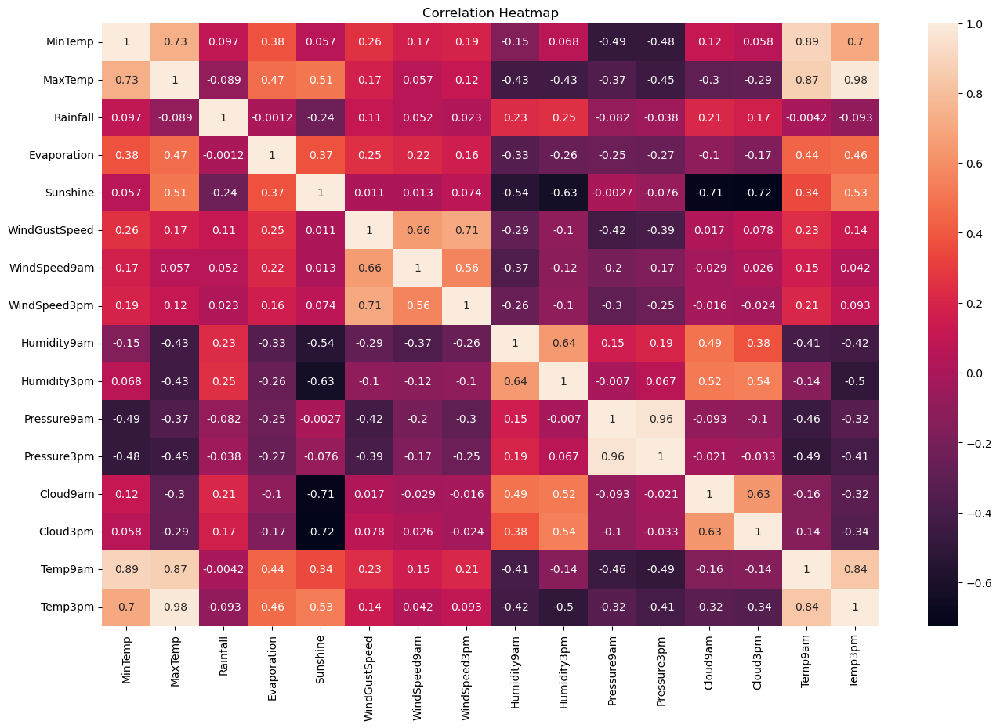

In [125]:
# Correlation heatmap for numerical columns
plt.figure(figsize = (16,10))
corr_matrix = df[numerical_columns].corr()
sns.heatmap(df[numerical_columns].corr(), annot = True)
plt.title('Correlation Heatmap')
plt.show()

In [126]:
# Checking missing values
df.isnull().sum()

Location            0
MinTemp            61
MaxTemp            48
Rainfall          129
Evaporation      2912
Sunshine         3227
WindGustDir       933
WindGustSpeed     933
WindDir9am        785
WindDir3pm        285
WindSpeed9am       54
WindSpeed3pm       91
Humidity9am        45
Humidity3pm        87
Pressure9am      1299
Pressure3pm      1302
Cloud9am         1857
Cloud3pm         1893
Temp9am            42
Temp3pm            83
RainToday         129
RainTomorrow      129
year                0
month               0
day                 0
dtype: int64

In [127]:
# Imputing missing values in categorical variables

In [128]:
for col in categorical_columns:
    df[col].fillna(df[col].mode()[0], inplace = True)

In [129]:
# After imputation 
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24


In [130]:
# Dropping Missing Values less than 2% missing 

In [131]:
threshold = 0.02
missing_percentage = df.isnull().mean()
columns_below_threshold = missing_percentage[missing_percentage < threshold].index
print("Columns with less than 2% missing values:")
print(columns_below_threshold)

Columns with less than 2% missing values:
Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir',
       'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm',
       'Humidity9am', 'Humidity3pm', 'Temp9am', 'Temp3pm', 'RainToday',
       'RainTomorrow', 'year', 'month', 'day'],
      dtype='object')


In [132]:
# Dropping rows with missing values in these columns 

In [133]:
df_cleaned = df.dropna(subset = columns_below_threshold)
df_cleaned

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,...,1021.2,NaN,NaN,9.4,20.9,No,No,2017,6,20
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23


In [134]:
df.shape

(6753, 25)

In [135]:
# After getting dropped 

In [136]:
df_cleaned.shape

(6456, 25)

In [137]:
df = df_cleaned.copy()

In [138]:
# Encoding Categorical columns

In [139]:
from sklearn.preprocessing import LabelEncoder

In [140]:
# Applying label encoding
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

In [141]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,0.6,NaN,NaN,13,44.0,13,14,...,1007.1,8.0,NaN,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,NaN,NaN,14,44.0,6,15,...,1007.8,NaN,NaN,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,NaN,NaN,15,46.0,13,15,...,1008.7,NaN,2.0,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,NaN,NaN,4,24.0,9,0,...,1012.8,NaN,NaN,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,NaN,NaN,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,2008,12,5


In [142]:
# Now my categorical are encoded using label encoding method 

In [143]:
# Remainig missing values

In [144]:
df.isnull().sum()

Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation      2696
Sunshine         3007
WindGustDir         0
WindGustSpeed     767
WindDir9am          0
WindDir3pm          0
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am      1155
Pressure3pm      1154
Cloud9am         1713
Cloud3pm         1714
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
year                0
month               0
day                 0
dtype: int64

In [145]:
# Using Imputation Method

In [146]:
columns = ['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm', 'Pressure9am', 'Pressure3pm', 'WindGustSpeed']

for col in columns:
    df[col] = df[col].fillna(df[col].mean())

In [147]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,0.6,5.267739,7.921137,13,44.0,13,14,...,1007.1,8.000000,4.313581,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,5.267739,7.921137,14,44.0,6,15,...,1007.8,4.339448,4.313581,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,5.267739,7.921137,15,46.0,13,15,...,1008.7,4.339448,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,5.267739,7.921137,4,24.0,9,0,...,1012.8,4.339448,4.313581,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,5.267739,7.921137,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,5


In [148]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
year             0
month            0
day              0
dtype: int64

In [149]:
# Now you can see that there are no null values stored in the dataset

In [150]:
# Removing Outliers 

In [151]:
columns = ['Evaporation',  'Pressure9am', 'Pressure3pm', 'WindGustSpeed', 'Temp9am', 'Temp3pm', 'WindSpeed9am', 'WindSpeed3pm','MaxTemp', 'Humidity9am']

In [152]:
columns

['Evaporation',
 'Pressure9am',
 'Pressure3pm',
 'WindGustSpeed',
 'Temp9am',
 'Temp3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'MaxTemp',
 'Humidity9am']

In [153]:
# Columns having outliers

In [154]:
# We have selected the features with outliers from univariate analysis

In [155]:
# We will use z-score to remove outliers

In [156]:
from scipy import stats

In [157]:
z_score = np.abs(stats.zscore(df[columns]))

In [158]:
threshold = 3
df_cleaned = df[(z_score < threshold).all(axis=1)]

In [159]:
df.shape

(6456, 25)

In [160]:
df_cleaned.shape

(6183, 25)

In [161]:
# Before removing outliers
# After removing outliers

In [162]:
# Checking skewness of the data

In [163]:
df_skew = df.skew().sort_values(ascending=False)

In [164]:
df_skew

Rainfall         13.366735
Evaporation       3.831323
RainTomorrow      1.266809
RainToday         1.234283
WindSpeed9am      0.960049
WindGustSpeed     0.776612
WindSpeed3pm      0.550640
year              0.398690
Temp3pm           0.343573
MaxTemp           0.318690
WindDir9am        0.191763
Humidity3pm       0.152698
WindGustDir       0.075054
Pressure3pm       0.046365
month             0.029429
Pressure9am       0.022462
Location          0.012012
day               0.005130
Temp9am          -0.052845
MinTemp          -0.079107
WindDir3pm       -0.105164
Cloud3pm         -0.156547
Cloud9am         -0.216212
Humidity9am      -0.252255
Sunshine         -0.883985
dtype: float64

In [165]:
# We are going to select the columns having skewness greater than 0.5 and apply transform methods

In [166]:
skew_columns = df_skew[df_skew > 0.5].index.to_list()
skew_columns = sorted(skew_columns)
skew_columns

['Evaporation',
 'RainToday',
 'RainTomorrow',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed3pm',
 'WindSpeed9am']

In [167]:
# We will consider only numerical columns only for transformation.
# Rainfall and Rain Tomorrow are two target features

In [168]:
skew_columns.remove('RainToday')
skew_columns.remove('RainTomorrow')
skew_columns

['Evaporation', 'Rainfall', 'WindGustSpeed', 'WindSpeed3pm', 'WindSpeed9am']

In [169]:
# Applying log transformation
df_transformed = df.copy()
df_transformed[skew_columns] = np.log1p(df_transformed[skew_columns])

In [170]:
df_transformed.skew().sort_values(ascending=False)

Rainfall         1.920095
RainTomorrow     1.266809
RainToday        1.234283
year             0.398690
Temp3pm          0.343573
MaxTemp          0.318690
WindDir9am       0.191763
Humidity3pm      0.152698
WindGustDir      0.075054
Pressure3pm      0.046365
month            0.029429
Pressure9am      0.022462
Location         0.012012
day              0.005130
Temp9am         -0.052845
MinTemp         -0.079107
WindDir3pm      -0.105164
Cloud3pm        -0.156547
Cloud9am        -0.216212
Humidity9am     -0.252255
WindGustSpeed   -0.400869
Evaporation     -0.584012
Sunshine        -0.883985
WindSpeed9am    -1.032380
WindSpeed3pm    -1.671319
dtype: float64

In [171]:
df = df_transformed.copy()

In [172]:
# Our dataset is now normally distributed

In [173]:
# Feature scaling using Standarad Scalarization

In [174]:
# Seperating the target and independent variable into x and y

In [175]:
# Seperating features for regression model to predict rainfall

In [176]:
x = df.drop(['Rainfall'],axis = 1)
y = df['Rainfall']

In [177]:
x.shape

(6456, 24)

In [178]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,1.835416,7.921137,13,3.806662,13,14,3.044522,...,1007.1,8.000000,4.313581,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,1.835416,7.921137,14,3.806662,6,15,1.609438,...,1007.8,4.339448,4.313581,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,1.835416,7.921137,15,3.850148,13,15,2.995732,...,1008.7,4.339448,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,1.835416,7.921137,4,3.218876,9,0,2.484907,...,1012.8,4.339448,4.313581,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.835416,7.921137,13,3.737670,1,7,2.079442,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,5


In [179]:
y.shape

(6456,)

In [180]:
y.head()

0    0.470004
1    0.000000
2    0.000000
3    0.000000
4    0.693147
Name: Rainfall, dtype: float64

In [181]:
# Seperating features for classification model to predict rainfall tomorrow

In [182]:
x_1 = df.drop(['RainTomorrow'], axis = 1)
y_1 = df['RainTomorrow']

In [183]:
x_1.shape

(6456, 24)

In [184]:
x_1.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,year,month,day
0,1,13.4,22.9,0.470004,1.835416,7.921137,13,3.806662,13,14,...,1007.7,1007.1,8.000000,4.313581,16.9,21.8,0,2008,12,1
1,1,7.4,25.1,0.000000,1.835416,7.921137,14,3.806662,6,15,...,1010.6,1007.8,4.339448,4.313581,17.2,24.3,0,2008,12,2
2,1,12.9,25.7,0.000000,1.835416,7.921137,15,3.850148,13,15,...,1007.6,1008.7,4.339448,2.000000,21.0,23.2,0,2008,12,3
3,1,9.2,28.0,0.000000,1.835416,7.921137,4,3.218876,9,0,...,1017.6,1012.8,4.339448,4.313581,18.1,26.5,0,2008,12,4
4,1,17.5,32.3,0.693147,1.835416,7.921137,13,3.737670,1,7,...,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,2008,12,5


In [185]:
y_1.shape

(6456,)

In [186]:
y_1.head()

0    0
1    0
2    0
3    0
4    0
Name: RainTomorrow, dtype: int32

In [187]:
# Scaling the data 

In [188]:
# Scaling the data for regression model to predict Rainfall

In [189]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Scaling data
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,-1.37353,0.053819,-0.196596,0.203411,-3.222704e-16,1.203538,0.514992,1.298783,1.362785,0.781650,...,-1.342804,1.471395,0.000000,-0.176700,-0.150996,-0.558028,-0.550387,-1.744059,1.656819,-1.677050
1,-1.37353,-1.020074,0.160342,0.203411,-3.222704e-16,1.396014,0.514992,-0.233193,1.583417,-0.675620,...,-1.226339,0.000000,0.000000,-0.124591,0.264753,-0.558028,-0.550387,-1.744059,1.656819,-1.563430
2,-1.37353,-0.035672,0.257689,0.203411,-3.222704e-16,1.588489,0.639513,1.298783,1.583417,0.732106,...,-1.076598,0.000000,-0.984731,0.535447,0.081823,-0.558028,-0.550387,-1.744059,1.656819,-1.449811
3,-1.37353,-0.697906,0.630851,0.203411,-3.222704e-16,-0.528741,-1.168149,0.423368,-1.726063,0.213383,...,-0.394445,0.000000,0.000000,0.031734,0.630612,-0.558028,-0.550387,-1.744059,1.656819,-1.336191
4,-1.37353,0.787647,1.328503,0.203411,-3.222704e-16,1.203538,0.317430,-1.327462,-0.181639,-0.198351,...,-1.525821,1.069435,1.569053,-0.020375,1.162770,-0.558028,-0.550387,-1.744059,1.656819,-1.222571


In [190]:
# Scaling the data for classification model to predict Rain Tomorrow

In [191]:
scaler2 = StandardScaler()
# Scaling data
x_1 = pd.DataFrame(scaler2.fit_transform(x_1), columns = x_1.columns)
x_1.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,year,month,day
0,-1.37353,0.053819,-0.196596,-0.054481,0.203411,-3.222704e-16,1.203538,0.514992,1.298783,1.362785,...,-1.644136,-1.342804,1.471395,0.000000,-0.176700,-0.150996,-0.558028,-1.744059,1.656819,-1.677050
1,-1.37353,-1.020074,0.160342,-0.542676,0.203411,-3.222704e-16,1.396014,0.514992,-0.233193,1.583417,...,-1.166811,-1.226339,0.000000,0.000000,-0.124591,0.264753,-0.558028,-1.744059,1.656819,-1.563430
2,-1.37353,-0.035672,0.257689,-0.542676,0.203411,-3.222704e-16,1.588489,0.639513,1.298783,1.583417,...,-1.660595,-1.076598,0.000000,-0.984731,0.535447,0.081823,-0.558028,-1.744059,1.656819,-1.449811
3,-1.37353,-0.697906,0.630851,-0.542676,0.203411,-3.222704e-16,-0.528741,-1.168149,0.423368,-1.726063,...,-0.014649,-0.394445,0.000000,0.000000,0.031734,0.630612,-0.558028,-1.744059,1.656819,-1.336191
4,-1.37353,0.787647,1.328503,0.177299,0.203411,-3.222704e-16,1.203538,0.317430,-1.327462,-0.181639,...,-1.133892,-1.525821,1.069435,1.569053,-0.020375,1.162770,-0.558028,-1.744059,1.656819,-1.222571


In [192]:
# Multicollinearity Analysis and Feature Selection

In [193]:
# Checking VIF for classification model to predict Rain Tomorrow

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(x_1.values, i) for i in range(x_1.shape[1])]
vif["features"] = x_1.columns
vif.sort_values(by = "VIF", ascending = False)

,VIF,features
19,44.109491,Temp3pm
2,35.346551,MaxTemp
14,21.781106,Pressure9am
15,20.716309,Pressure3pm
18,18.820320,Temp9am
1,9.291309,MinTemp
13,6.243452,Humidity3pm
3,4.862082,Rainfall
20,4.750526,RainToday
12,4.391360,Humidity9am


In [194]:
# By checking values of VIF we can find the features causing multicollinearity problem. Here we can find the same features

In [195]:
#Temp3pm
#MaxTemp
#Pressure9am
#Pressure3pm
#Temp9am

In [196]:
# This feature have VIF value greater than 10. 

In [197]:
# Dropping the columns with multicollinearity

In [198]:
x_1 = x_1.drop(['Temp3pm', 'MaxTemp', 'Pressure9am', 'Pressure3pm', 'Temp9am'], axis = 1)
x_1.head()

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,year,month,day
0,-1.37353,0.053819,-0.054481,0.203411,-3.222704e-16,1.203538,0.514992,1.298783,1.362785,0.781650,0.684171,0.207859,-1.523173,1.471395,0.000000,-0.558028,-1.744059,1.656819,-1.677050
1,-1.37353,-1.020074,-0.542676,0.203411,-3.222704e-16,1.396014,0.514992,-0.233193,1.583417,-0.675620,0.566062,-1.351793,-1.362210,0.000000,0.000000,-0.558028,-1.744059,1.656819,-1.563430
2,-1.37353,-0.035672,-0.542676,0.203411,-3.222704e-16,1.588489,0.639513,1.298783,1.583417,0.732106,0.793186,-1.698383,-1.093939,0.000000,-0.984731,-0.558028,-1.744059,1.656819,-1.449811
3,-1.37353,-0.697906,-0.542676,0.203411,-3.222704e-16,-0.528741,-1.168149,0.423368,-1.726063,0.213383,-0.613746,-1.294029,-1.845099,0.000000,0.000000,-0.558028,-1.744059,1.656819,-1.336191
4,-1.37353,0.787647,0.177299,0.203411,-3.222704e-16,1.203538,0.317430,-1.327462,-0.181639,-0.198351,0.437201,0.843273,-0.932976,1.069435,1.569053,-0.558028,-1.744059,1.656819,-1.222571


In [199]:
# Dropping the columns with Multicollinearity issue

In [200]:
# Balancing the dataset for classification model 

In [201]:
df['RainTomorrow'].value_counts()

RainTomorrow
0    4955
1    1501
Name: count, dtype: int64

In [202]:
# As we can see that our target feature is imbalanced

In [203]:
# So we will use SMOTE to balance the dataset

In [204]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x_1,y_1 = sm.fit_resample(x_1,y_1)

In [205]:
y_1.value_counts()

RainTomorrow
0    4955
1    4955
Name: count, dtype: int64

In [206]:
# Models for Predicting Rainfall

In [207]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [208]:
# Splitting the training and test split

In [209]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [210]:
models = [('LinearRegression',LinearRegression()), ('DecisionRegressor',DecisionTreeRegressor()),('RandomForestRegressor',RandomForestRegressor()), ('GradientBoostingRegressor',GradientBoostingRegressor()), ('KNieghborsRegressor',KNeighborsRegressor()), ('SVR',SVR()), ('Lasso',Lasso()), ('Ridge',Ridge())]

In [211]:
# Train models and evaluating performance

In [212]:
for name, model in models:
    model.fit(x_train, y_train)
    print(name, model.score(x_test, y_test))
    y_pred = model.predict(x_test)
    print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
    print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
    print(r2_score(y_test, y_pred))

LinearRegression 0.7989267942883688
Mean Squared Error: 0.17319104566360327
Mean Absolute Error: 0.2437362078689833
0.7989267942883688
DecisionRegressor 0.6238669369573182
Mean Squared Error: 0.32397592840112477
Mean Absolute Error: 0.268825772760494
0.6238669369573182
RandomForestRegressor 0.8081402511013992
Mean Squared Error: 0.16525518860110813
Mean Absolute Error: 0.21596508462691055
0.8081402511013992
GradientBoostingRegressor 0.8064281050378014
Mean Squared Error: 0.16672991700181108
Mean Absolute Error: 0.2148788884434512
0.8064281050378014
KNieghborsRegressor 0.7513155289346807
Mean Squared Error: 0.2142002134579353
Mean Absolute Error: 0.2330471307470323
0.7513155289346807
SVR 0.7924540817568448
Mean Squared Error: 0.17876620843900673
Mean Absolute Error: 0.23495696896716148
0.7924540817568448
Lasso -0.0003467131337333562
Mean Squared Error: 0.8616319248535163
Mean Absolute Error: 0.7162516483260426
-0.0003467131337333562
Ridge 0.7989495858031338
Mean Squared Error: 0.1731714

In [213]:
# The Random Forest Regressor is the best model for predicting rainfall out there in comparison to others
# As It has highest r2 score with lower mean squared error and mean absolute error

In [214]:
# Now we will perform Cross validation for all models

In [215]:
from sklearn.model_selection import cross_val_score

for name, model in models:
    print(name, cross_val_score(model, x, y, cv = 5, scoring = 'r2').mean())

LinearRegression 0.7913075261768229
DecisionRegressor 0.5813040184729901
RandomForestRegressor 0.8064612580810129
GradientBoostingRegressor 0.8077709649005744
KNieghborsRegressor 0.7419538627822732
SVR 0.7667456719170573
Lasso -0.006682084360163243
Ridge 0.791319076366983


In [216]:
# From the above cross validation scores we can see that Random Forest Regressor is the best model for predicting rainfall out there
# As It has highest r2 score with lower mean squared error and mean absolute error

In [217]:
# Now its time to apply hyperparameter tuning of Random Forest Regressor 

In [218]:
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators':[50,100],
'max_features':['auto', 'sqrt'],
'max_depth':[None, 10],
'min_samples_split':[2, 5],
'min_samples_leaf':[1, 2],
'bootstrap':[True]}

In [219]:
rf = RandomForestRegressor(random_state = 42)

In [220]:
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 5, n_jobs = -1)

In [221]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [None, 10],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [50, 100]})

In [222]:
best_params = grid_search.best_params_

In [223]:
print(best_params)

{'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}


In [225]:
# Final Model
final_model = RandomForestRegressor(random_state = 42, bootstrap = True, max_depth = None, max_features = 'sqrt', min_samples_leaf = 2, min_samples_split = 2, n_estimators = 1)
final_model.fit(x_train, y_train)

RandomForestRegressor(max_features='sqrt', min_samples_leaf=2, n_estimators=1,
                      random_state=42)

In [226]:
y_pred = final_model.predict(x_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('R2 Score:',r2_score(y_test, y_pred))

Mean Squared Error: 0.36324748780985155
Mean Absolute Error: 0.29989352202508757
R2 Score: 0.578273018903696


In [227]:
# Final Model has highest r2 score with lower mean squared error and mean absolute error

In [228]:
# import libraries
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_curve,roc_auc_score

In [229]:
# Model for predicting RainTomorrow

In [230]:
# Splitting the training and test split
x_train, x_test, y_train, y_test = train_test_split(x_1, y_1, test_size = 0.2, random_state = 0)

In [232]:
models = {'LogisticRegression': LogisticRegression(), 'DecisionTreeClassifier': DecisionTreeClassifier(),'GradientBoostingClassifier': GradientBoostingClassifier(),'RandomForestClassifier': RandomForestClassifier(),
          'AdaBoostClassifier': AdaBoostClassifier(),'ExtraTreesClassifier': ExtraTreesClassifier(),'BaggingClassifier': BaggingClassifier()}

In [234]:
for name, model in models.items():
    model.fit(x_train, y_train)
    print(name, model.score(x_test, y_test))
    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print('Accuracy:', accuracy)
    print('Confusion Matrix:', confusion_matrix(y_test, y_pred))
    print('Classification Report:', classification_report(y_test, y_pred))

LogisticRegression 0.7769929364278506
Accuracy: 0.7769929364278506
Confusion Matrix: [[784 203]
 [239 756]]
Classification Report:               precision    recall  f1-score   support

           0       0.77      0.79      0.78       987
           1       0.79      0.76      0.77       995

    accuracy                           0.78      1982
   macro avg       0.78      0.78      0.78      1982
weighted avg       0.78      0.78      0.78      1982

DecisionTreeClassifier 0.8168516649848637
Accuracy: 0.8168516649848637
Confusion Matrix: [[788 199]
 [164 831]]
Classification Report:               precision    recall  f1-score   support

           0       0.83      0.80      0.81       987
           1       0.81      0.84      0.82       995

    accuracy                           0.82      1982
   macro avg       0.82      0.82      0.82      1982
weighted avg       0.82      0.82      0.82      1982

GradientBoostingClassifier 0.8491422805247225
Accuracy: 0.8491422805247225
Confu

In [236]:
# The Extra Trees Classifier is the best model for predicting rainfall out there in comparison to others
# As It has highest accuracy with lower confusion matrix and classification report

In [235]:
from sklearn.model_selection import cross_val_score

for name, model in models.items():
    print(name, cross_val_score(model, x_1, y_1, cv = 5, scoring = 'accuracy').mean())

LogisticRegression 0.7277497477295661
DecisionTreeClassifier 0.6286579212916247
GradientBoostingClassifier 0.6193743693239153
RandomForestClassifier 0.6749747729566095
AdaBoostClassifier 0.6323915237134208
ExtraTreesClassifier 0.7134207870837537
BaggingClassifier 0.6607467204843592


In [237]:
# After performing cross validation the Extra Trees Classifier is the best model for predicting rainfall out there
# As It has highest accuracy with lower confusion matrix and classification report

In [238]:
# Hyper parameter tuning of  ExtraTreesClassifier

In [239]:
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators':[50,100],
              'max_features':['auto', 'sqrt'],
              'max_depth':[None, 10],
              'min_samples_split':[2, 5],
              'min_samples_leaf':[1, 2],
              'bootstrap':[True]}

In [240]:
et = ExtraTreesClassifier()
grid_search = GridSearchCV(estimator = et, param_grid = param_grid, cv = 5, n_jobs = -1)

In [241]:
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [None, 10],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [50, 100]})

In [242]:
best_params = grid_search.best_params_
print(best_params)

{'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


In [243]:
# Final Model
final_model = ExtraTreesClassifier(random_state = 42, bootstrap = True, max_depth = None, max_features = 'sqrt', min_samples_leaf = 1, min_samples_split = 2, n_estimators = 1)

In [244]:
final_model.fit(x_train, y_train)

ExtraTreesClassifier(bootstrap=True, n_estimators=1, random_state=42)

In [245]:
y_pred = final_model.predict(x_test)
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
print('R2 Score:',r2_score(y_test, y_pred))

Mean Squared Error: 0.21644803229061554
Mean Absolute Error: 0.21644803229061554
R2 Score: 0.13419376517847603


In [246]:
print('Accuracy:', accuracy_score(y_test, y_pred))

Accuracy: 0.7835519677093845


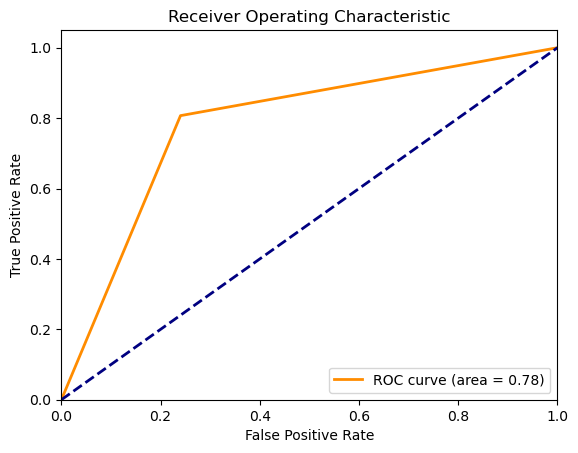

In [247]:
# Plotting ROC curve
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [249]:
# Predicting the model

y_pred = final_model.predict(x_test)

In [251]:
# Predicted values
y_pred

array([1, 1, 0, ..., 0, 1, 0])

In [253]:
# Actual values
np.array(y_test)

array([1, 1, 0, ..., 0, 0, 1])

In [248]:
# Saving the model
import pickle
pickle.dump(final_model, open('model.pkl', 'wb'))